# **¿Que propiedades del vino se relacionan con alta calidad?**

El dataset se saco de [de aqui](https://archive.ics.uci.edu/dataset/186/wine+quality).

Los datasets provienen de muestras de vino portugues "Vinho Verde". Para mas informacion consultar [la pagina web de Vinho Verde](http://www.vinhoverde.pt/), o el  [articulo de 2009 que ya lo ha estudiado](https://www.researchgate.net/publication/221612614_Using_Data_Mining_for_Wine_Quality_Assessment).


Cada dataset contiene siguientes fisico-quimicos faciles de analizar:

* ***Acidez fija***: Es la cantidad de acidos del vino (tanto provenientes de la uva como el tartarico, malico o citrico como los provenientes de la fermentacion, como acetico, lactivo o succinico) que no se evaporan. Medido en (g(acido tartarico)/L)
* ***Acidez volatil***: una medida para calcular el acido acetico del vino. a 1 g/L tiene un olor que se asemeja al vinagre g(acido acetico)/L
* ***Acido citrico***: un acidulante usado en la inductria. (g/l)
* ***Azucar residual***: es la cantidad de azucares que queda  tras la fermentacion g/l
* ***Cloruros***: cantidades de cloruro probenientes de de la uva junto con otras sales que son añadidas para mejorar propiedades( como AgCl) (g(NaCl)/L). 
* ***Dioxido de Azufre***: se usa para inhibio la oxidacion o la conservacion del vino. Deben avisar si supera los 10 mg/l. A partir de ahora se referira a este compuesto como SO2.
* ***Dioxido de Azufre libre***: Dioxido de azufre que no a reaccionado con el tiempo (mg/L). A partir de ahora SO2.
* ***Densidad***: g/L
* ***pH***: medida de acidez. Cuanto mas bajo, mas acido es el vino.
* ***Sulfatos***: provenientes de la planta  o de echar sulfato de plata paraa eliminar microorganismos g(K2SO4/L)
* ***Alcohol***: vol% 


Y un valor de 1-10 de una cata a ciegas de la muestra.




In [103]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

Primero leemos el CSV del vino tinto

In [5]:
data_raw=pd.read_csv("wine+quality/winequality-red.csv", sep=";")
data_raw

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [6]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


No parece que haya haga falta procesar los datos de momento.

Veamos como se distribuyen los valores:

<Axes: xlabel='residual sugar', ylabel='Count'>

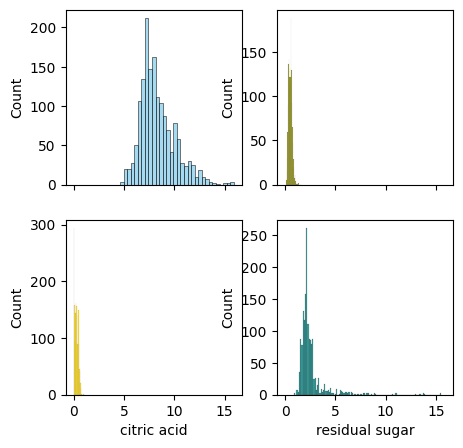

In [7]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_raw["fixed acidity"] , color="skyblue", ax=axes[0, 0])
sns.histplot(data_raw["volatile acidity"] , color="olive", ax=axes[0, 1])
sns.histplot(data_raw["citric acid"] , color="gold", ax=axes[1, 0])
sns.histplot(data_raw["residual sugar"] , color="teal", ax=axes[1, 1])

<Axes: xlabel='density', ylabel='Count'>

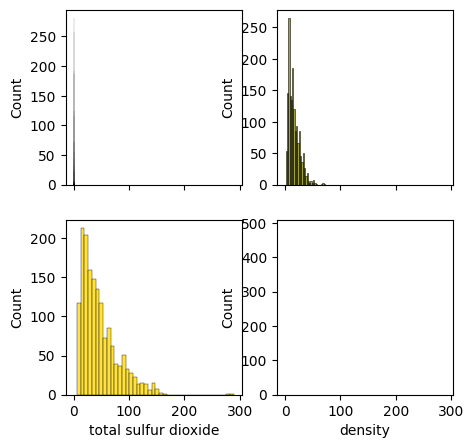

In [8]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_raw["chlorides"] , color="skyblue", ax=axes[0, 0], bins=100)
sns.histplot(data_raw["free sulfur dioxide"] , color="olive", ax=axes[0, 1])
sns.histplot(data_raw["total sulfur dioxide"] , color="gold", ax=axes[1, 0])
sns.histplot(data_raw["density"] , color="teal", ax=axes[1, 1], bins= 10)

La densidad existe, lo que pasa es que esta en torno a 1.

<Axes: xlabel='quality', ylabel='Count'>

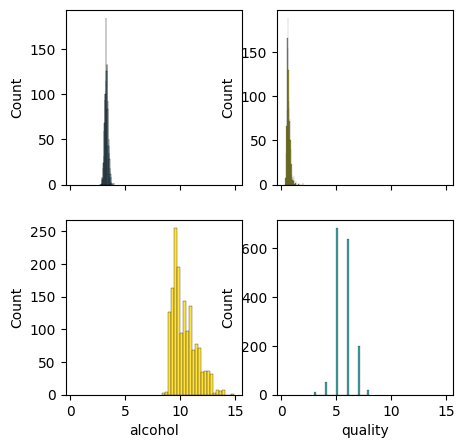

In [9]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_raw["pH"] , color="skyblue", ax=axes[0, 0])
sns.histplot(data_raw["sulphates"] , color="olive", ax=axes[0, 1])
sns.histplot(data_raw["alcohol"] , color="gold", ax=axes[1, 0])
sns.histplot(data_raw["quality"] , color="teal", ax=axes[1, 1])


<Axes: xlabel='citric acid', ylabel='Count'>

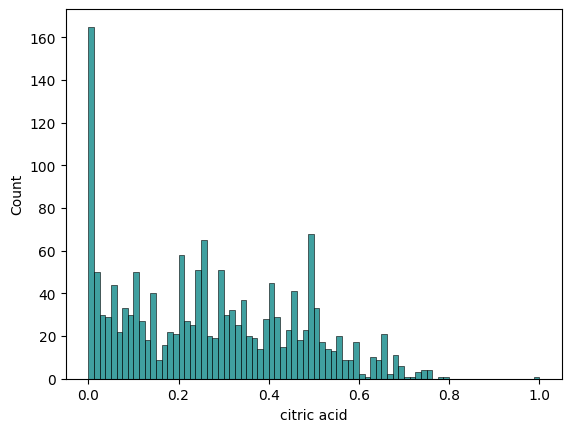

In [10]:
"""["fixed acidity"]
["volatile acidity"]
["citric acid"]
["residual sugar"]
["chlorides"]
["free sulfur dioxide"]
["total sulfur dioxide"]
["density"]
["pH"]
["sulphates"]
["alcohol"]"""
sns.histplot(data_raw["citric acid"] , color="teal", bins=80)

Ahora veamos cuales de estas propiedades se relacionan entre si:

<Axes: >

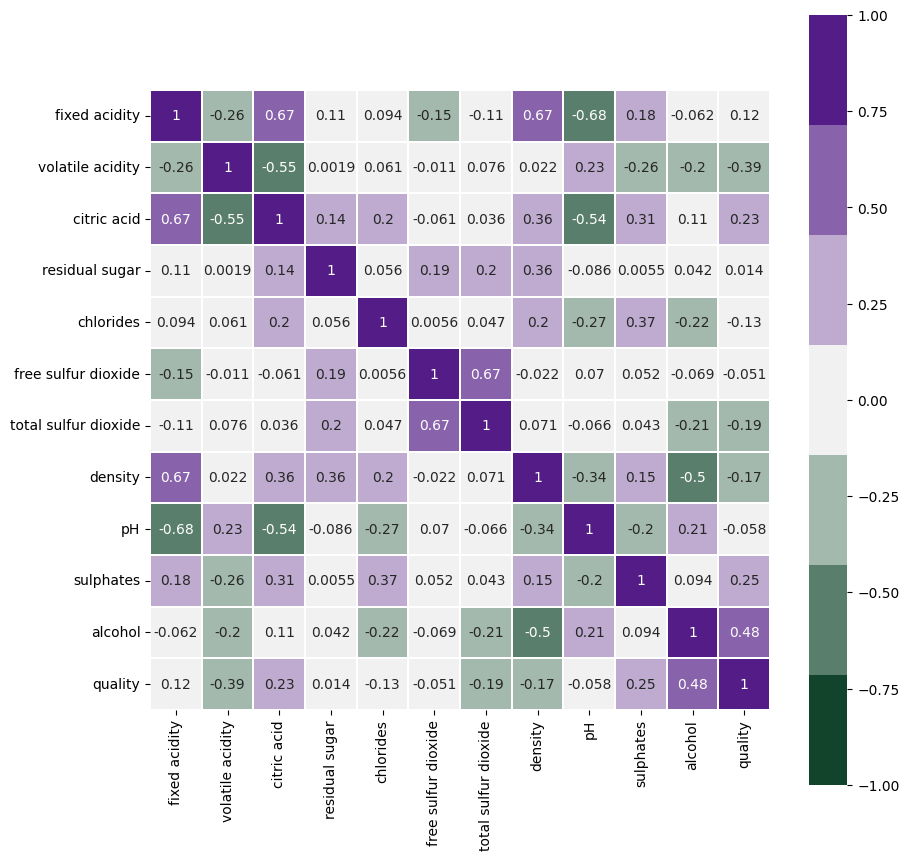

In [11]:
plt.figure(figsize=(10,10))
sns.heatmap(data_raw.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True)

* La acidez fija esta relacionada:
    * Acidez volatil 
    * Negativamente ácido cítrico
    * Densidad
    * Negativamente con el pH
    * Sulfato
    * SO2 libre
    * SO2 total

Era esperable que estos esten relacionados con las variables que miden acidos y con el sulfato.  

* La acidez volatil esta relacionada:
    * Negativamente Acidez volatil
    * Negativamente Acido citrico
    * Azucar residual
    * Cloruro
    * Densidad
    * Sulfato
    * Calidad


* El azúcar residual:
    * Acido cítrico
    * SO2 y SO2 libre
    * Densidad
Tiene sentido de que el azucar este relacioano con el citrico, ya que este acido podria estar relacionado con la fermentación

* Cloruro:
    * Cítrico
    * Densidad
    * Negativamente pH
    * Sulfatos
    * Negativamente alcohol


* El SO2 libre
    * SO2 (obviamente)
    * Azucar residual
    * Acidez fija

* SO2  
    * SO2
    * Negativamente alcohol 
    * Negativamente la calidad

* Densidad
    * Acidez fija
    * Citrico
    * azucar 
    * cloro
    * neg pH
    * negativamente Alcphol
    * Sulfatos
    * Negativamente calidad

* pH
    * Neg acidez fija 
    * Acidez fija
    * negetivamente citrico
    * Negativametne cloruro
    * Negativamente densidad
    * Negativamente Sulfato
    * Alcohol

* Sulfato
    * acidez fija
    * Negativamente Acidez volatil
    * Acido citrico
    * Cloruro
    * Densidad
    * Negativamente pH
    * Positivamente calidad


* El alcohol:
    * Negativamente con la densidad
    * Negativamente con los acidos volatiles 
    * Cloruros 
    * SO2 total 
Tiene sentido que que un alto contenido en alcohol este realcionado con una baja densidad
Tambien tiene sentido que los vino que tengan mas acidos volatiles tengan menos alcohol. Podria ser que que los acidos volatiles no se hayan tranformado al completo se formen a  partir del alchol. Aunque lo mas probabe es que los acidos provienen del alcohol.

* Y finalmente la calidad esta relacionada:
    * Negativamente Acidez volatil (-0.39)
    * Acido citrico(0.23)
    * Negativamente con al SO2 total(-0.19)
    * Negativamente con la densidad(-0.17)
    * Sulfatos (0.25)
    * Alcohol(0.48)
    
Parece que los consumidores apreacian mucho el contenido de alcohol y de acido citrico. La conconetracion de sulfatos tambien esta relacionado con una alta calidad.
Sin embargo, los  acidos volatiles,y SO2, y baja densidad enstan negativamente relacionados.

Parece que los consumidores apreacian mucho el contenido de alcohol y de acido citrico. La conconetracion de sulfatos tambien esta relacionado con una alta calidad.
Sin embargo, los  acidos volatiles,y SO2, y baja densidad enstan negativamente relacionados.

Estudiemos mas a fondo esto

<Figure size 1000x600 with 0 Axes>

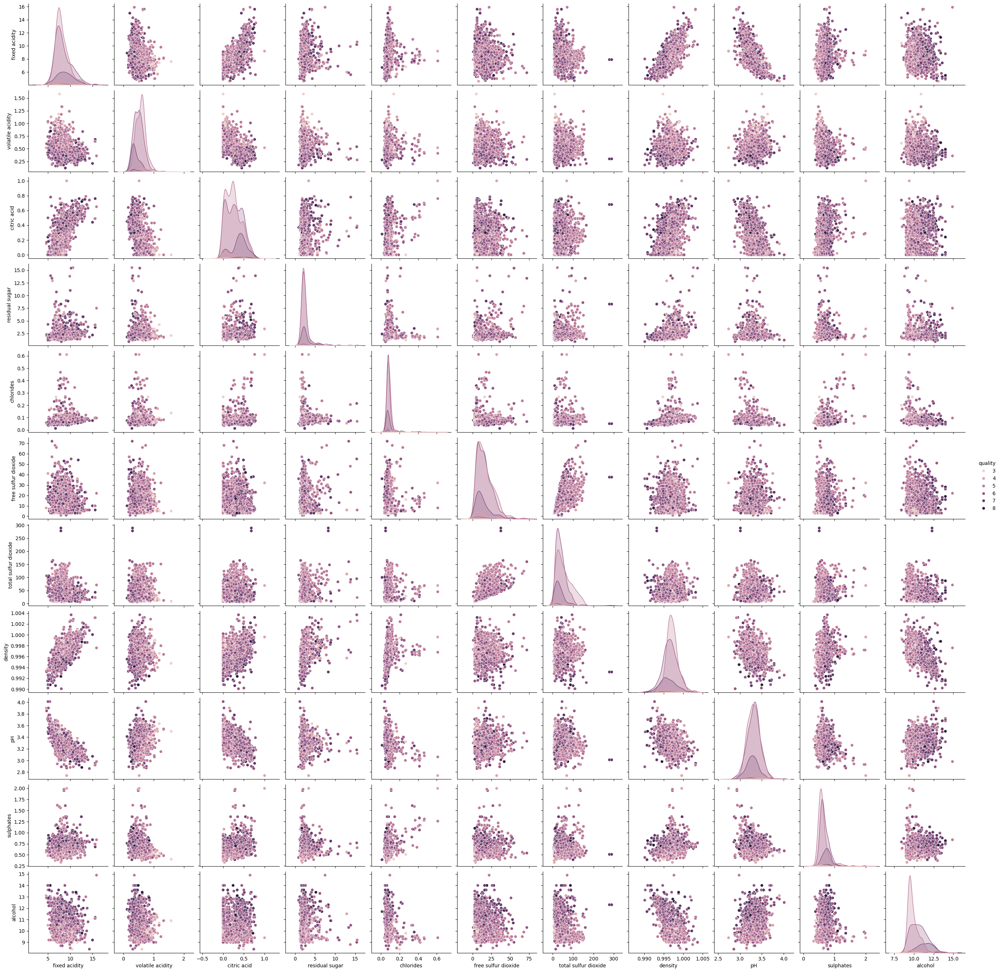

In [12]:
"""["fixed acidity"]
["volatile acidity"]
["citric acid"]
["residual sugar"]
["chlorides"]
["free sulfur dioxide"]
["total sulfur dioxide"]
["density"]
["pH"]
["sulphates"]
["alcohol"]"""
plt.figure(figsize=(10,6))
sns.pairplot(data_raw, hue="quality")

La acidez volatil, acido citrico, y alcohol tienen las distribuciones mas interesantes, vamos a estudiarlas mas de cerca.

#### Primero acidez volatil

<Axes: xlabel='volatile acidity', ylabel='Density'>

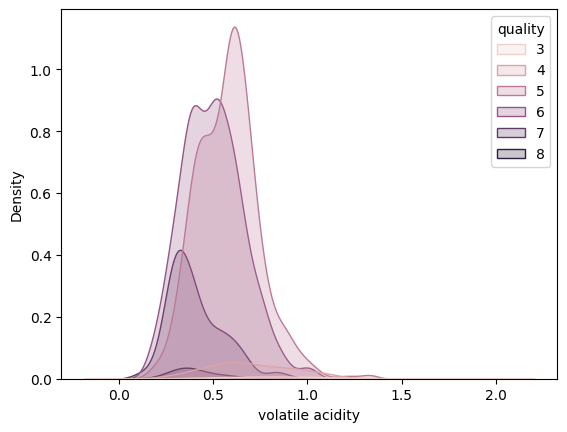

In [13]:

sns.kdeplot(x="volatile acidity", data=data_raw, hue="quality",  fill=True)


'import seaborn as sns\nsns.displot(density, kde=True)'

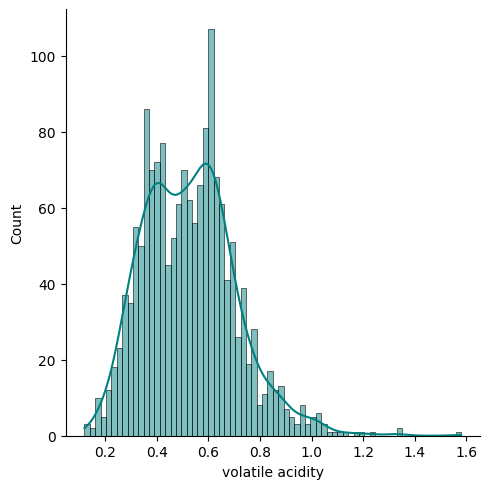

In [33]:
sns.displot(data_raw["volatile acidity"], kde= True, color="teal", bins=70 )

"""import seaborn as sns
sns.displot(density, kde=True)"""

Como se habia comentado antes,una menor concentracion de acido citrico se asocia a una mejor calidad. Aunque en las curvas parecia ser que practicamente en todas las calidades existen tres concentraciones en general. En el histograma se ve mas claro

### Ahora acido citrico

<Axes: xlabel='citric acid', ylabel='Density'>

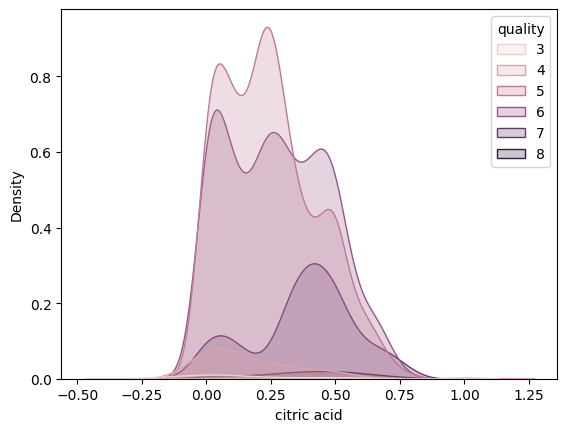

In [15]:

sns.kdeplot(x="citric acid", data=data_raw, hue="quality",  fill=True)

<Axes: xlabel='citric acid', ylabel='Count'>

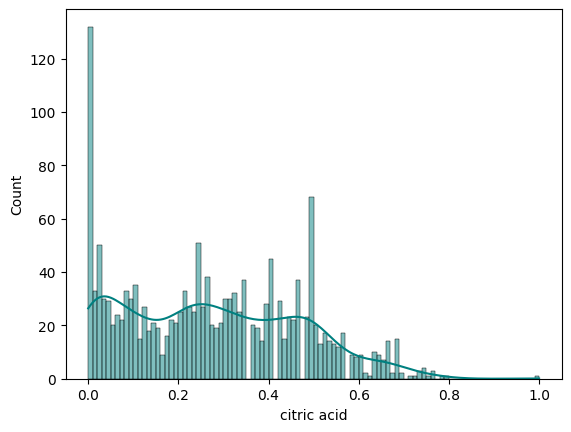

In [34]:
sns.histplot(data_raw["citric acid"] , color="teal", bins=100, kde= True)

Aqui pasa algo parecido. En las curvas se ven 3 niveles, pero en el histograma no se ve tan claro y es mas probable de que la muestra sea demasiado pequeña.
Estos "tres niveles"  seria 0; 0,25; y cerca de 0,50.


### Ahora contenido en alcohol

<Axes: xlabel='alcohol', ylabel='Density'>

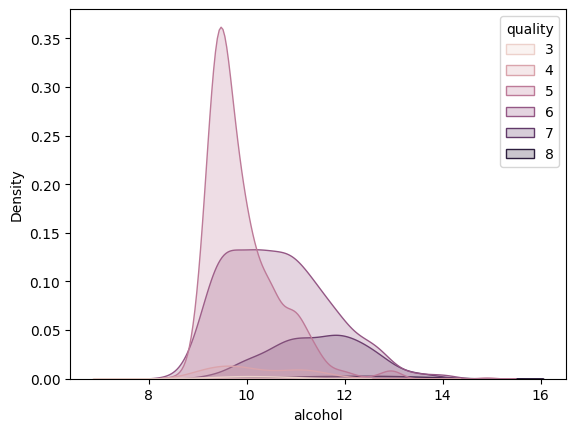

In [17]:
sns.kdeplot(x="alcohol", data=data_raw, hue="quality",  fill=True)

<Axes: xlabel='alcohol', ylabel='Count'>

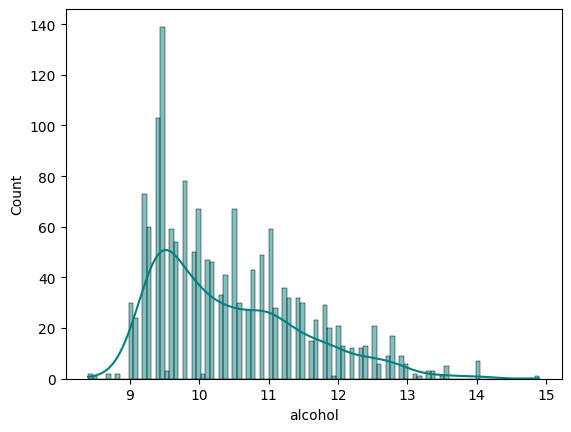

In [35]:
sns.histplot(data_raw["alcohol"] , color="teal", bins=100, kde= True)

Se puede ver que los vinos de menor calidad tienen una concentracion de alcohol menor, en torno al 9,5%, mientras que los vinos de mayor calidad estan muchos mas dispersos y mayormente en concentraciones mas altas.


### Finalmente sulfatos

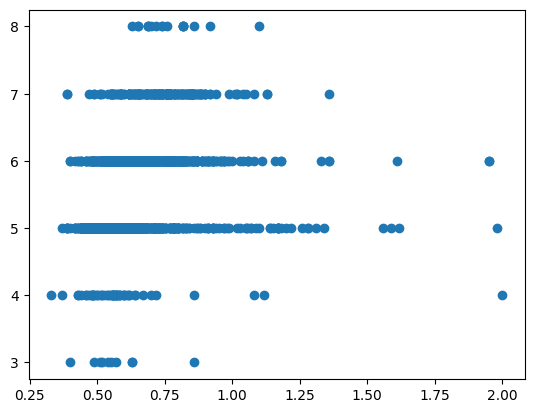

In [136]:
plt.scatter(x=data_raw["sulphates"], y=data_raw["quality"])

Parece que los vinos de calidad inferios no tienen tanto control en la concetracion de sulfatos. Los vinos de calidad mas alta ademas de tener concentraciones menos dispersas parece que se concentran mas en torno a 0.75 g/L

______

Ahora veamos como se realionan los tres a la vez.

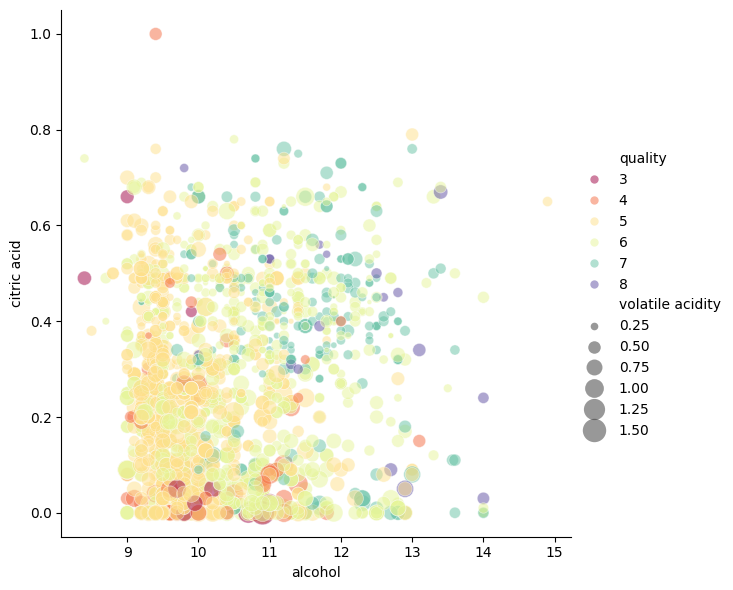

In [19]:
sns.relplot(data=data_raw,
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(4, 300),
            alpha=.5, palette="Spectral",
            height=6)

Hay demasiados vinos de baja calidad eclipsando la grafica.
Filtramos para solo ver los  vinos de maxima calidad:

<Figure size 200x200 with 0 Axes>

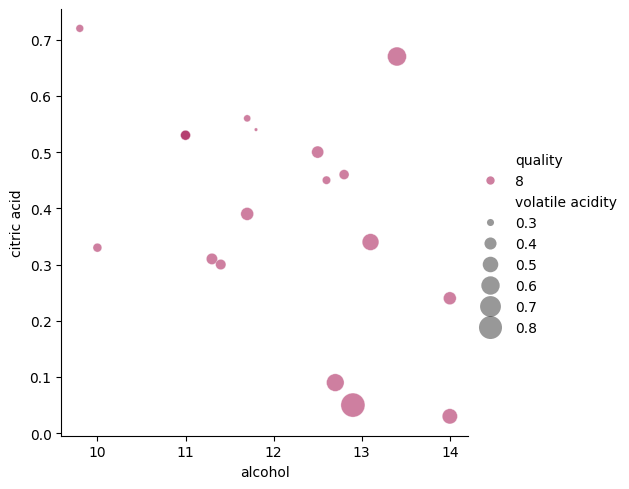

In [20]:
condicion=data_raw["quality"]>7
plt.figure(figsize=(2,2))
sns.relplot(data=data_raw[condicion],
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(6, 300),
            alpha=.5, palette="Spectral",
            height=5)

Aunque que se vean de forma clara y que la mayoria estarian separados de los vinos de peor calidad.
Son datos demasiado dispersos y escasos como para ver una tendencia clara

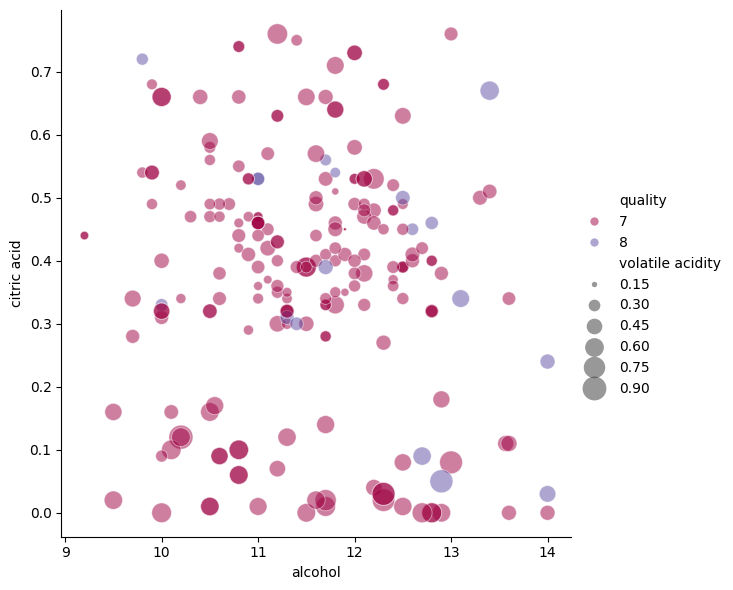

In [21]:
condicion=data_raw["quality"]>6

sns.relplot(data=data_raw[condicion],
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(4, 300),
            alpha=.5, palette="Spectral",
            height=6)

Los datos siguen dispersos, pero las tendencias se aprecian mejor. Tampoco se aprecian *outliers*. Parece ser que existen dos grupos:
* Los que tienen una concetracion de citrico media y acidez media
* Citrico bajo acidez volatil mas alta 

Sin una simplificacion de varibles es dificil de saber hasta que punto esto es "real".
Estudiemos las distribuciones.
(Agrupamos acido citrico y acidez volatil para ocupar menos espacio)

<Axes: >

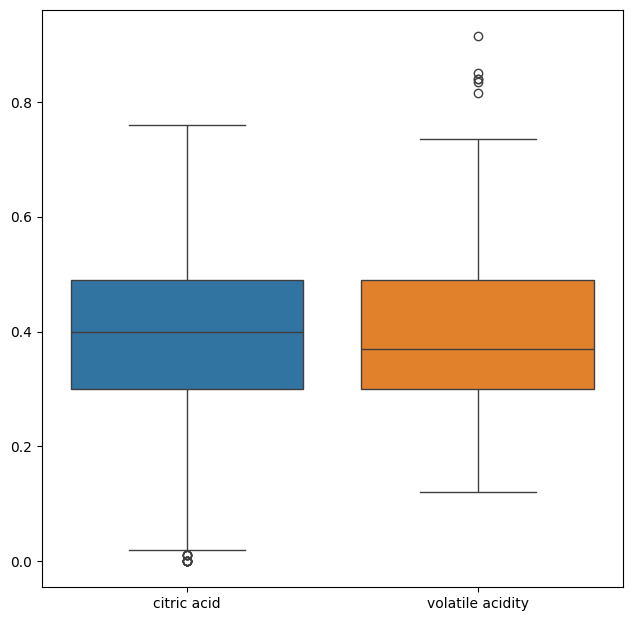

In [100]:
plt.figure(figsize=(7.5,7.5))
valores=["alcohol", "citric acid", "volatile acidity"]
data_classy=data_raw[condicion]
sns.boxplot(data=data_classy[["citric acid", "volatile acidity"]])


<Axes: ylabel='Count'>

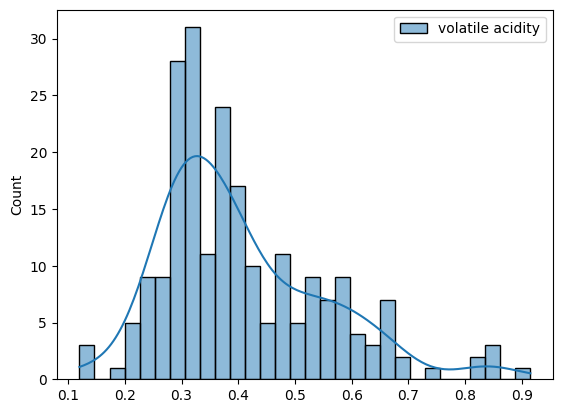

In [110]:
sns.histplot(data=data_classy[["volatile acidity"]], bins=30, kde=True)


In [104]:
stats.skew(data_classy[["volatile acidity"]])

array([0.99449445])

Segun el coeficiente de asimetria, no es tan asimetrico

<Axes: ylabel='Count'>

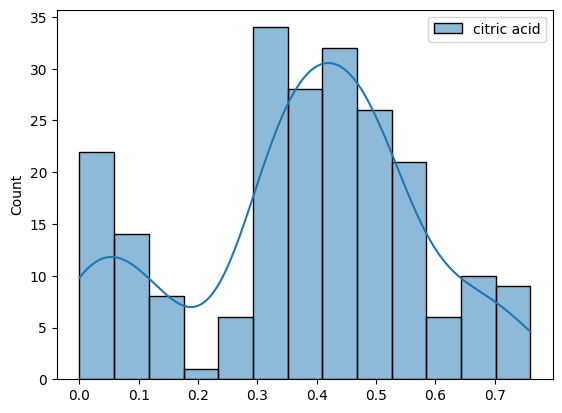

In [111]:
sns.histplot(data=data_classy[["citric acid"]], kde=True)


In [112]:
stats.skew(data_classy[["citric acid"]])

array([-0.37613563])

Recordemos que los percentiles de acido citrico no seran del todo fiables, debido a que no siguen una distribucion normal. 



Se puede ver que existen vinos con cantidad muy baja y cantidad media. 


<Axes: >

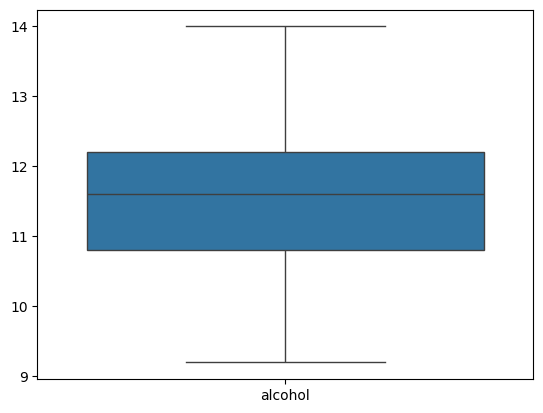

In [101]:
sns.boxplot(data=data_classy[["alcohol"]])

<Axes: ylabel='Count'>

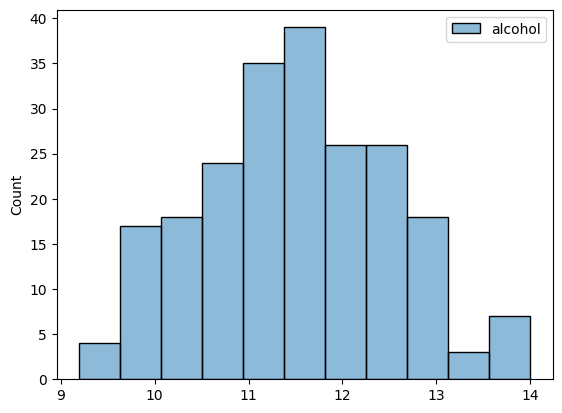

In [24]:
sns.histplot(data=data_classy[["alcohol"]])

In [75]:
data_per={}
cal_variable=data_classy[["volatile acidity","citric acid","alcohol"]]
for col in cal_variable:
    data_per[col]=((np.percentile(data_classy[col], 0)),(np.percentile(data_classy[col], 25)),((np.percentile(data_classy[col], 50))), ((np.percentile(data_classy[col], 75))), (np.percentile(data_classy[col], 100)))



data=pd.DataFrame(data_per, index=["p_0","p_25","p_50","p_75","p_100" ])
data


,volatile acidity,citric acid,alcohol
p_0,0.120,0.00,9.2
p_25,0.300,0.30,10.8
p_50,0.370,0.40,11.6
p_75,0.490,0.49,12.2
p_100,0.915,0.76,14.0


Podriamos concluir que los vinos que tengan las concetraciones por el rango de p_50 tendrian de una buena calidad. 
Sin embargo, solo se ha estudiado el efecto de 3 variables (acidez volatil, acido citrico, y volumen de alcohol)en la calidad del vino. Estas variables no se han relacionado entre si. Ademas el dataset, ademas de ser antiguo, es bastante limitado. El dataset no contiene vinos de calidad excepcional y no tiene en cuenta todos los compuestos que afectan al sabor y olor del vino (como polifenoles, eteres, o terpenos). 

Otra variable que no se a estudiado que tiene influencia en sulfato.

__________
Otra duda que surge es: ¿Estas propiedades afectan de otra manera al vino blanco?

In [113]:
data_white=pd.read_csv("wine+quality/winequality-white.csv", sep=";")
data_white

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


<Axes: >

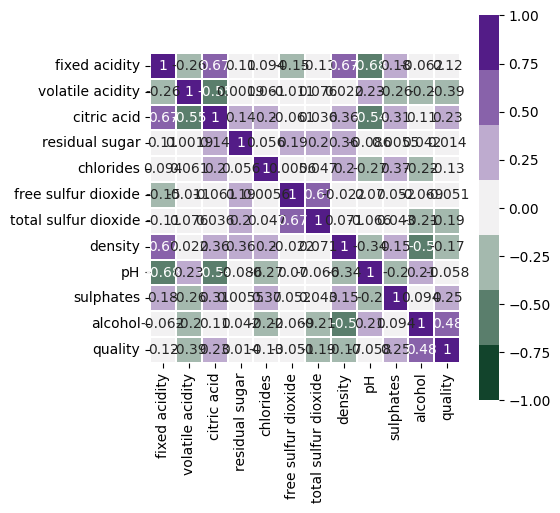

In [116]:
plt.figure(figsize=(5,5))
sns.heatmap(data_raw.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True)

<Axes: >

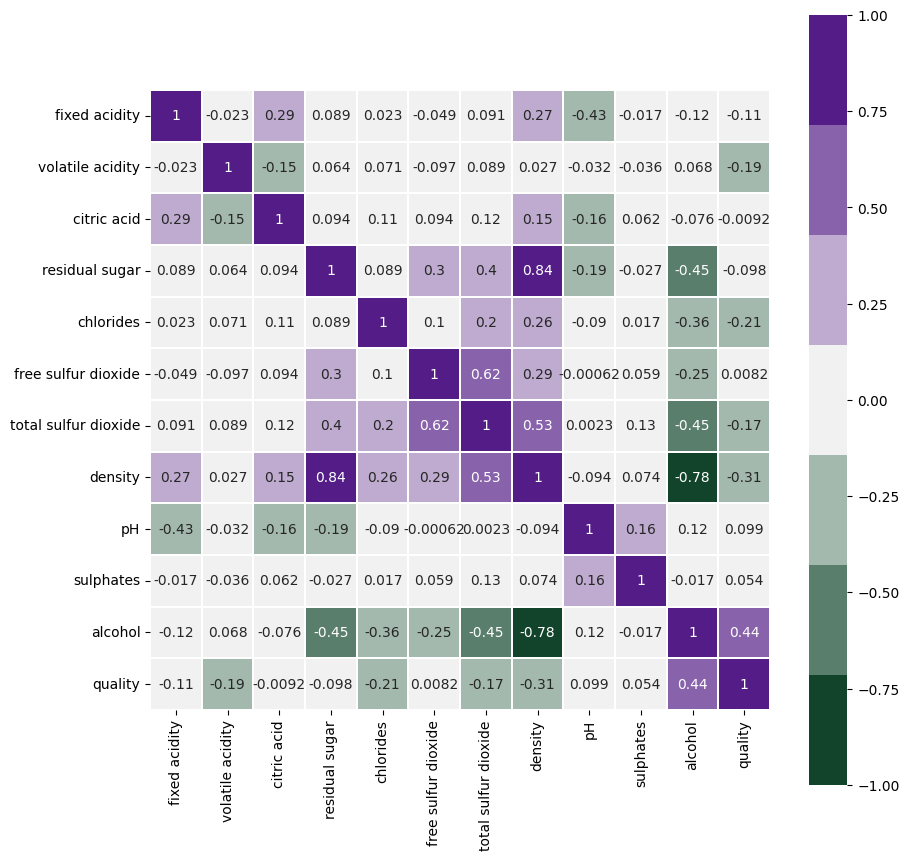

In [117]:
plt.figure(figsize=(10,10))
sns.heatmap(data_white.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True)

<Figure size 1000x600 with 0 Axes>

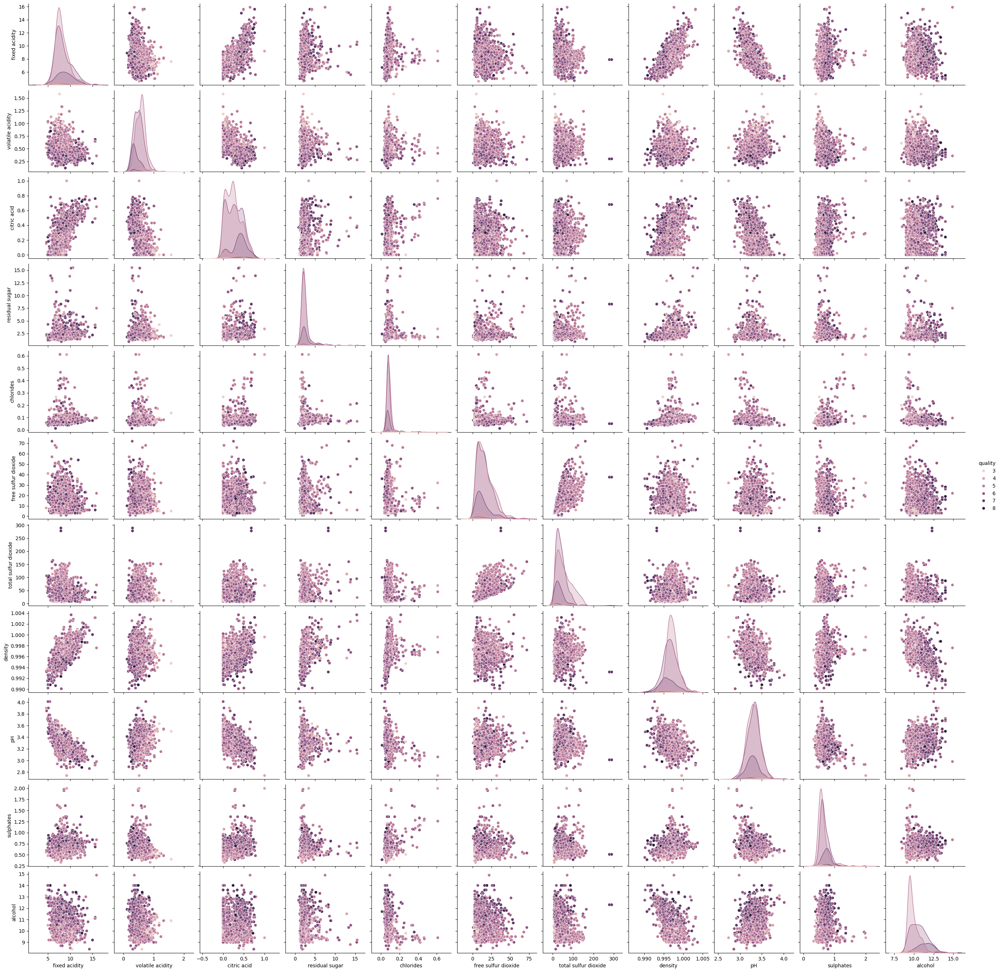

In [118]:
plt.figure(figsize=(10,6))
sns.pairplot(data_raw, hue="quality")


<Figure size 1000x600 with 0 Axes>

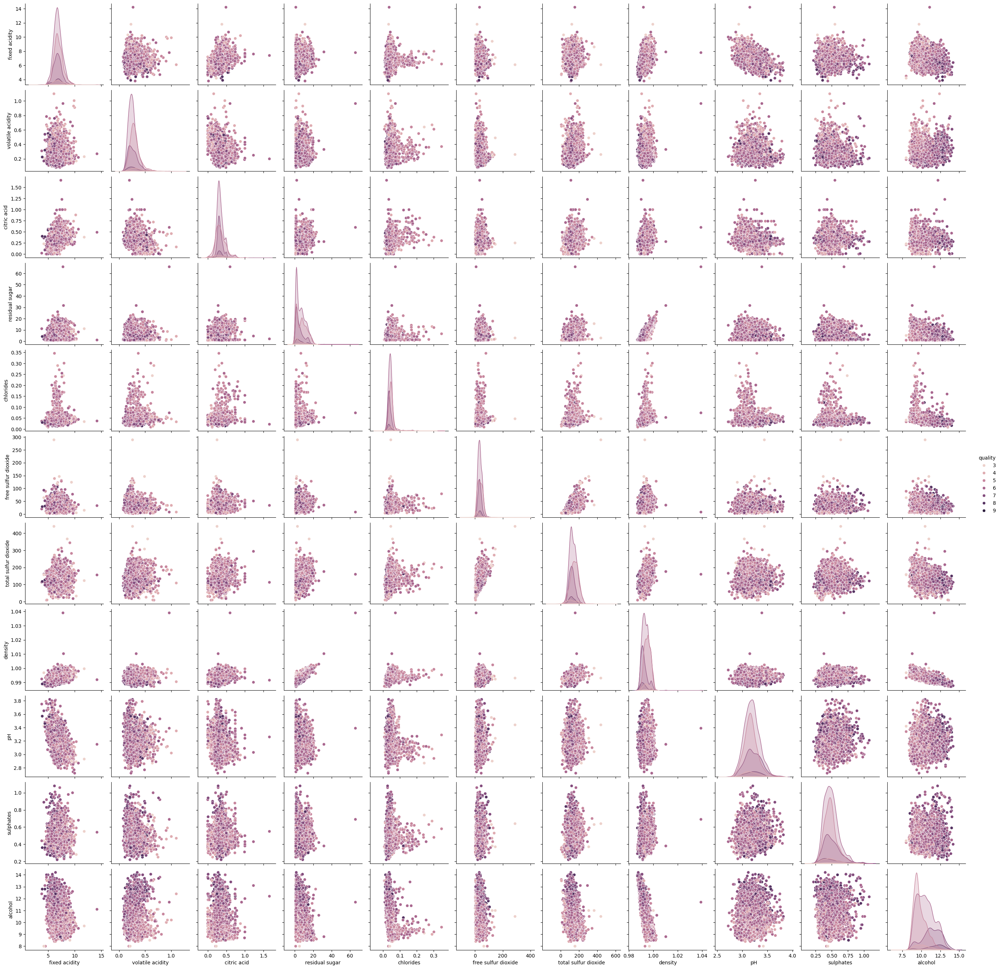

In [120]:
plt.figure(figsize=(10,6))
sns.pairplot(data_white, hue="quality")